<a href="https://colab.research.google.com/github/willow788/Pizza-or-Not-Pizza/blob/main/PizzaModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import kagglehub
path = kagglehub.dataset_download("carlosrunner/pizza-not-pizza")
data = kagglehub.load_dataset("carlosrunner/pizza-not-pizza", path=path)

Using Colab cache for faster access to the 'pizza-not-pizza' dataset.


TypeError: load_dataset() missing 1 required positional argument: 'handle'

In [3]:
!pip install --upgrade kagglehub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.2/69.2 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 12.1 MB/s eta 0:00:00
  Attempting uninstall: kagglehub
    Found existing installation: kagglehub 0.3.13
    Uninstalling kagglehub-0.3.13:
      Successfully uninstalled kagglehub-0.3.13


In [4]:
import kagglehub
path = kagglehub.dataset_download("carlosrunner/pizza-not-pizza")


Using Colab cache for faster access to the 'pizza-not-pizza' dataset.


In [5]:
!pip install tensorflow

In [15]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
print("done")

done


In [18]:
IMG_SIZE = (224, 224) # VGG16 expects 224x224 images
BATCH_SIZE = 32

train_gen = ImageDataGenerator(
    horizontal_flip = True,
    shear_range = 0.2,
    zoom_range = 0.2,
    validation_split = 0.2,
    rotation_range = 20,
    width_shift_range = 0.2,
    height_shift_range = 0.2
)

val_gen = ImageDataGenerator(
    validation_split = 0.2
)

# Adjust the path to point to the correct subdirectory
adjusted_path = path + '/pizza_not_pizza'

# Calculate steps per epoch explicitly
num_train_samples = 1574
num_val_samples = 392

steps_per_epoch_train = num_train_samples // BATCH_SIZE + (1 if num_train_samples % BATCH_SIZE > 0 else 0)
steps_per_epoch_val = num_val_samples // BATCH_SIZE + (1 if num_val_samples % BATCH_SIZE > 0 else 0)

def preprocess_image(image, label):
    image = tf.keras.applications.vgg16.preprocess_input(image)
    return image, label

# Create tf.data.Dataset for training
train_dataset = tf.data.Dataset.from_generator(
    lambda: train_gen.flow_from_directory(
        directory=adjusted_path,
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary',
        subset='training',
        shuffle=True # Ensure data is shuffled for training
    ),
    output_types=(tf.float32, tf.float32),
    output_shapes=((None, *IMG_SIZE, 3), (None,))
).map(preprocess_image).repeat().take(steps_per_epoch_train) # Take exactly the number of batches for one epoch

# Create tf.data.Dataset for validation
validation_dataset = tf.data.Dataset.from_generator(
    lambda: val_gen.flow_from_directory(
        directory=adjusted_path,
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary',
        subset='validation',
        shuffle=False # No need to shuffle validation data
    ),
    output_types=(tf.float32, tf.float32),
    output_shapes=((None, *IMG_SIZE, 3), (None,))
).map(preprocess_image).repeat().take(steps_per_epoch_val) # Take exactly the number of batches for one epoch

print(f"Training dataset created with {num_train_samples} samples, {steps_per_epoch_train} steps per epoch.")
print(f"Validation dataset created with {num_val_samples} samples, {steps_per_epoch_val} steps.")


Training dataset created with 1574 samples, 50 steps per epoch.
Validation dataset created with 392 samples, 13 steps.


In [19]:
#defining an earlystopping function
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [20]:
!ls -F {path}

pizza_not_pizza/


In [28]:
#now we will load the model
base_model = VGG16(
    weights = 'imagenet',
    include_top = False,
    input_shape = (*IMG_SIZE, 3)
)
#freezing the conv layers
for layer in base_model.layers:
    layer.trainable = False

#final model
model = Sequential([
    base_model,
    Flatten(),
    Dropout(0.5),
    Dense(128, activation= 'relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),

    Dense(1, activation = 'sigmoid')
])

In [30]:
#compiling the model
model.compile(
    optimizer = Adam(learning_rate=0.0001),
    loss = 'binary_crossentropy',
    metrics = ['accuracy']
)
print("model compiled!")

model compiled!


In [33]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

#training the model
history_of_training = model.fit(
    train_dataset,
    validation_data = validation_dataset,
    epochs = 12, # Keep a higher number of epochs, EarlyStopping will stop it if needed
    steps_per_epoch = steps_per_epoch_train,
    validation_steps = steps_per_epoch_val,
    callbacks=[early_stopping]
)

print("model trained!")

Epoch 1/12
Found 1574 images belonging to 2 classes.
49/50 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.8998 - loss: 0.5324Found 392 images belonging to 2 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 559ms/step - accuracy: 0.9003 - loss: 0.5315 - val_accuracy: 0.9515 - val_loss: 0.3987
Epoch 2/12
Found 1574 images belonging to 2 classes.
49/50 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.9314 - loss: 0.4576Found 392 images belonging to 2 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 28s 550ms/step - accuracy: 0.9314 - loss: 0.4566 - val_accuracy: 0.9490 - val_loss: 0.3905
Epoch 3/12
Found 1574 images belonging to 2 classes.
49/50 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.9248 - loss: 0.4732Found 392 images belonging to 2 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 28s 560ms/step - accuracy: 0.9250 - loss: 0.4730 - val_accuracy: 0.9490 - val_loss: 0.3892
Epoch 4/12
Found 1574 images belonging to 2 classes.
49/50 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.9259 - loss: 0.4297Found 392 image

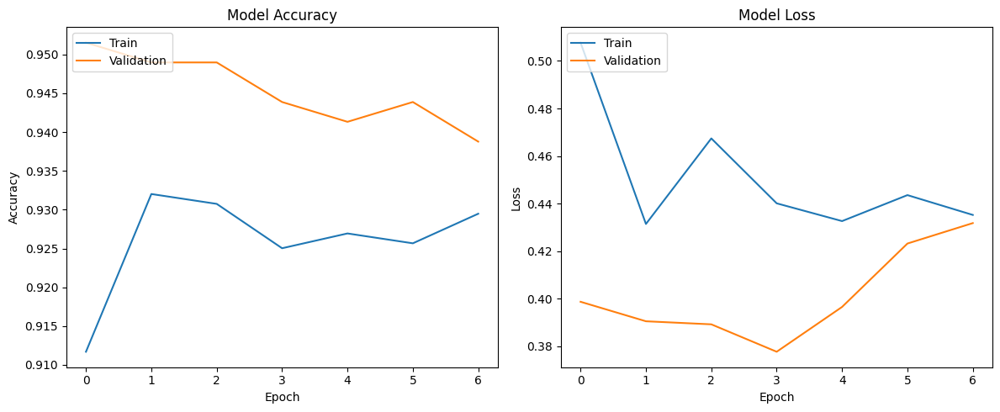

In [35]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_of_training.history['accuracy'])
plt.plot(history_of_training.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_of_training.history['loss'])
plt.plot(history_of_training.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

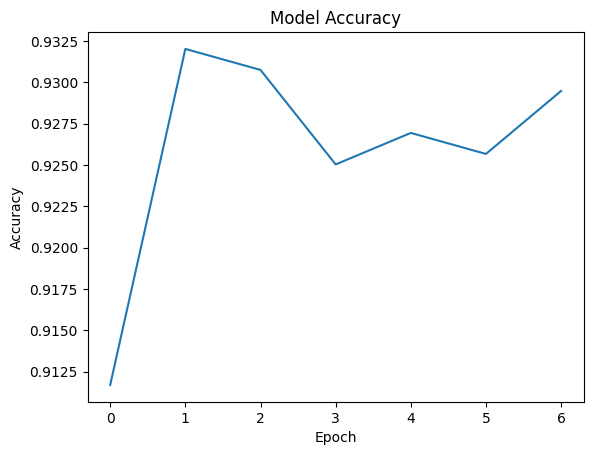

In [36]:
#plotting the accuracy curve
plt.plot(history_of_training.history['accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

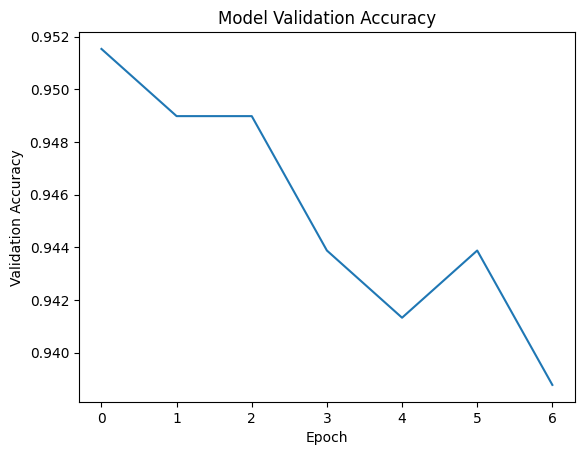

In [37]:
#model validation accuracy
plt.plot(history_of_training.history['val_accuracy'])
plt.title('Model Validation Accuracy')
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.show()

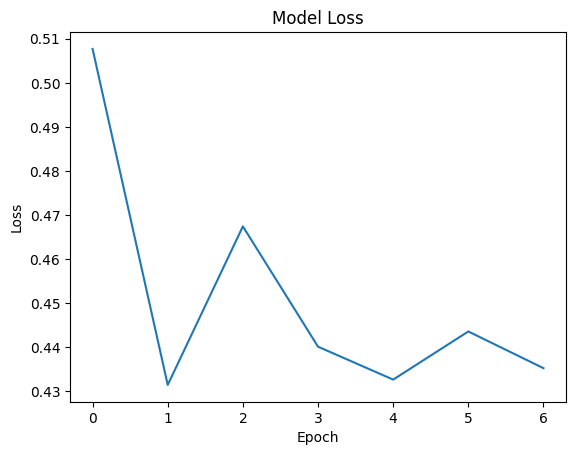

In [38]:
#plotting the model loss
plt.plot(history_of_training.history['loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

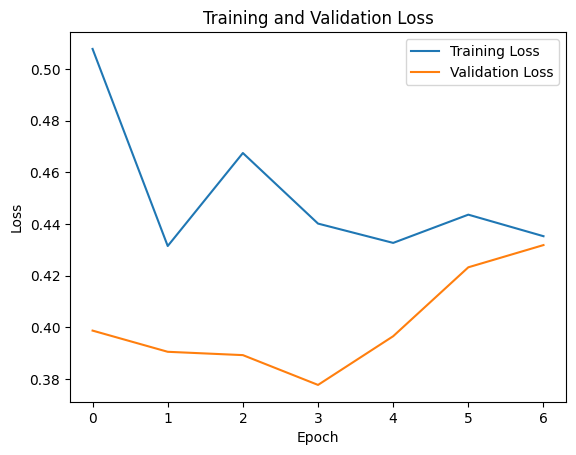

In [39]:
#plotting difference btw traning and validation metrics
plt.plot(history_of_training.history['loss'], label='Training Loss')
plt.plot(history_of_training.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

Predicting for a Pizza image:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


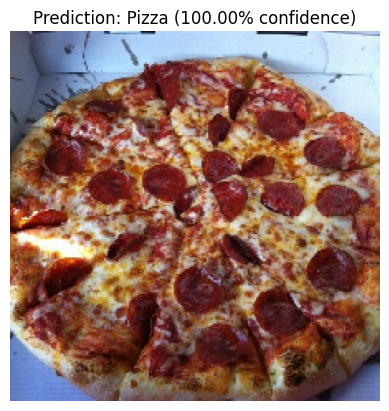


Predicting for a Not Pizza image:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


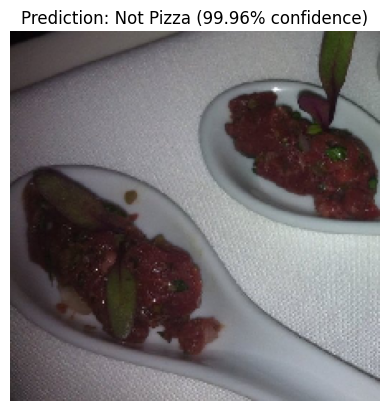

In [44]:
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Function to load and preprocess an image
def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) # Create a batch dimension
    img_array = tf.keras.applications.vgg16.preprocess_input(img_array)
    return img_array, img

# Function to make and display prediction
def predict_and_display(model, img_path, class_names=None):
    if class_names is None:
        class_names = {0: 'Not Pizza', 1: 'Pizza'} # Default for binary classification

    processed_img, original_img = load_and_preprocess_image(img_path)
    prediction = model.predict(processed_img)
    predicted_class_index = (prediction > 0.5).astype(int)[0][0] # Assuming sigmoid output
    predicted_class_name = class_names[predicted_class_index]
    probability = prediction[0][0] * 100 if predicted_class_index == 1 else (1 - prediction[0][0]) * 100

    plt.imshow(original_img)
    plt.title(f"Prediction: {predicted_class_name} ({probability:.2f}% confidence)")
    plt.axis('off')
    plt.show()

# --- Example Usage ---
# Make sure to replace these paths with actual paths to your images
# For example, you can pick images from your 'pizza_not_pizza' dataset

pizza_image_path = f'{adjusted_path}/pizza/1001116.jpg' # Corrected example path for a pizza image
not_pizza_image_path = f'{adjusted_path}/not_pizza/1005746.jpg' # Corrected example path for a not_pizza image

print("Predicting for a Pizza image:")
predict_and_display(model, pizza_image_path)

print("\nPredicting for a Not Pizza image:")
predict_and_display(model, not_pizza_image_path)

In [41]:
print(f"Contents of {adjusted_path}:")
!ls -F {adjusted_path}

Contents of /kaggle/input/pizza-not-pizza/pizza_not_pizza:
food101_subset.py  not_pizza/  pizza/


In [42]:
print(f"Contents of {adjusted_path}/pizza:")
!ls -F {adjusted_path}/pizza | head -n 5

Contents of /kaggle/input/pizza-not-pizza/pizza_not_pizza/pizza:
1001116.jpg
1008104.jpg
1008144.jpg
1008844.jpg
1008941.jpg


In [45]:
print(f"Contents of {adjusted_path}/not_pizza:")
!ls -F {adjusted_path}/not_pizza | head -n 10

Contents of /kaggle/input/pizza-not-pizza/pizza_not_pizza/not_pizza:
1005746.jpg
1009225.jpg
1012312.jpg
1018802.jpg
1020735.jpg
1027142.jpg
102839.jpg
1043233.jpg
1045400.jpg
104773.jpg


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


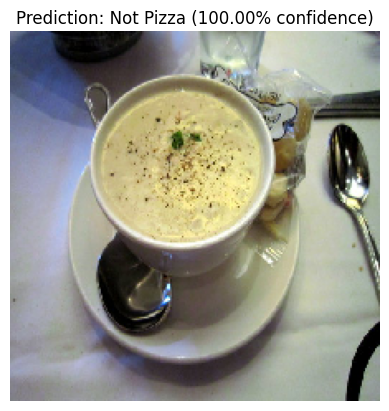

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


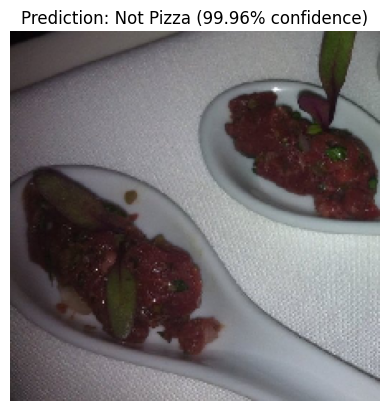

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


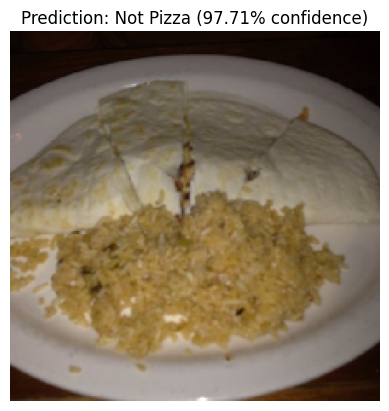

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


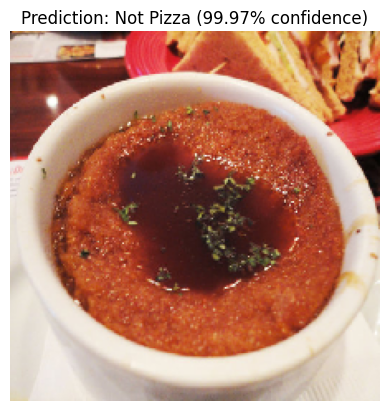

In [51]:
#predicting on a non pizza and displaying it
pizza_image_path = f'{adjusted_path}/not_pizza/102839.jpg'

predict_and_display(model, pizza_image_path)

pizza_image_path = f'{adjusted_path}/not_pizza/1005746.jpg'

predict_and_display(model, pizza_image_path)

pizza_image_path = f'{adjusted_path}/not_pizza/1009225.jpg'

predict_and_display(model, pizza_image_path)

pizza_image_path = f'{adjusted_path}/not_pizza/1020735.jpg'

predict_and_display(model, pizza_image_path)


--- More Pizza Predictions ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


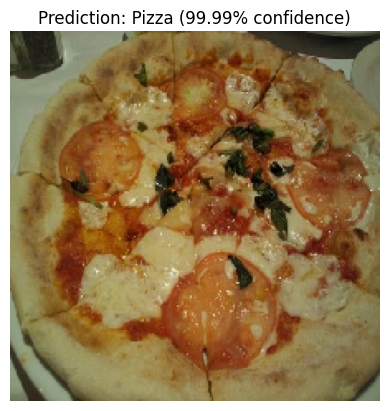

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


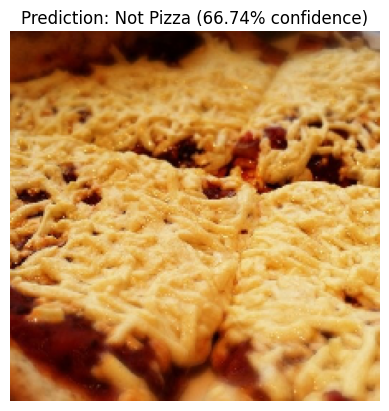


--- More Non-Pizza Predictions ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


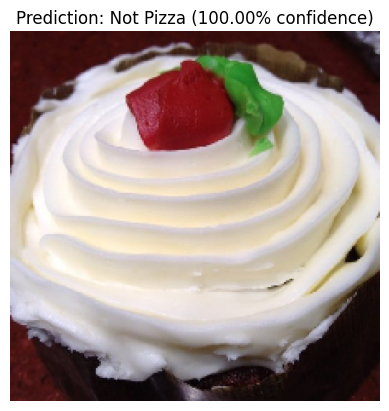

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


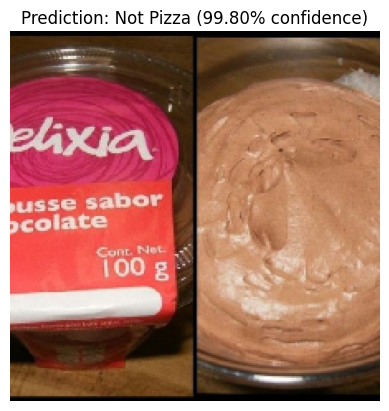

In [52]:
# More predictions on pizza images
print("\n--- More Pizza Predictions ---")
pizza_image_path_1 = f'{adjusted_path}/pizza/1008104.jpg'
predict_and_display(model, pizza_image_path_1)

pizza_image_path_2 = f'{adjusted_path}/pizza/1008144.jpg'
predict_and_display(model, pizza_image_path_2)

# More predictions on non-pizza images
print("\n--- More Non-Pizza Predictions ---")
not_pizza_image_path_1 = f'{adjusted_path}/not_pizza/1012312.jpg'
predict_and_display(model, not_pizza_image_path_1)

not_pizza_image_path_2 = f'{adjusted_path}/not_pizza/1018802.jpg'
predict_and_display(model, not_pizza_image_path_2)


--- 10 More Pizza Predictions ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


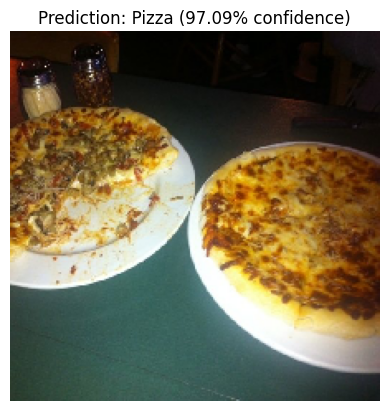

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


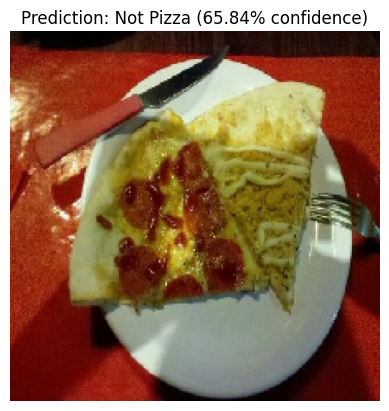

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


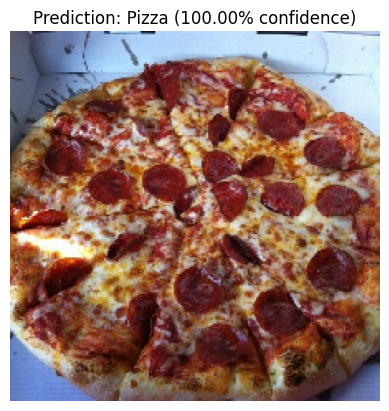

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


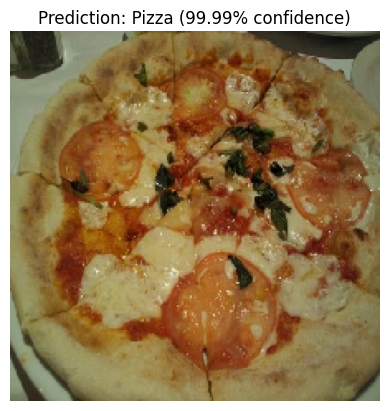

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


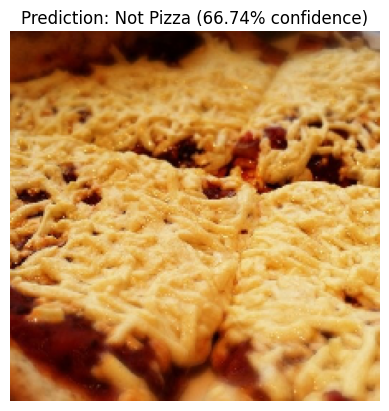

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


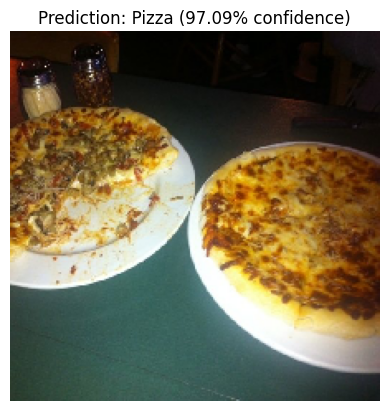

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


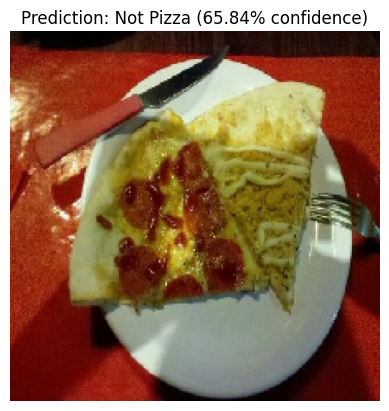

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


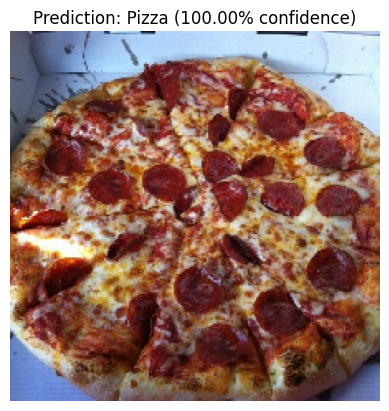

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


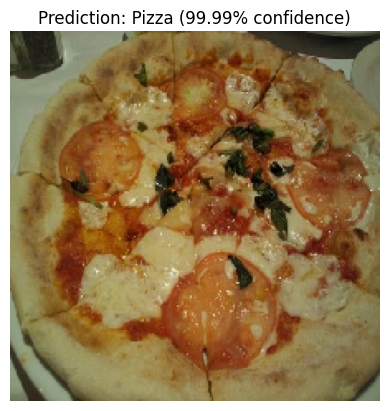

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


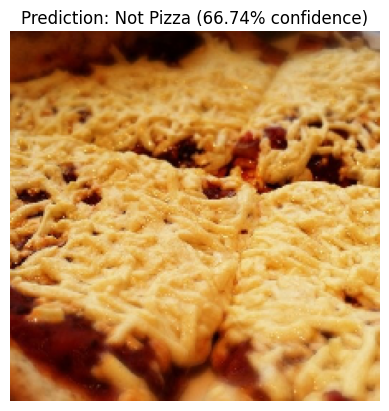


--- 10 More Non-Pizza Predictions ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


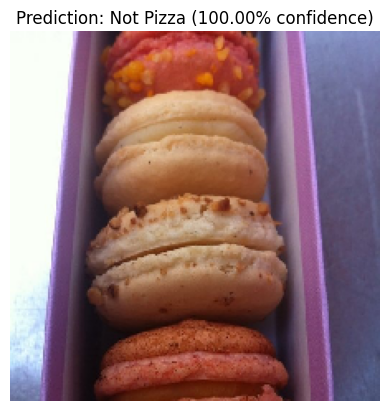

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


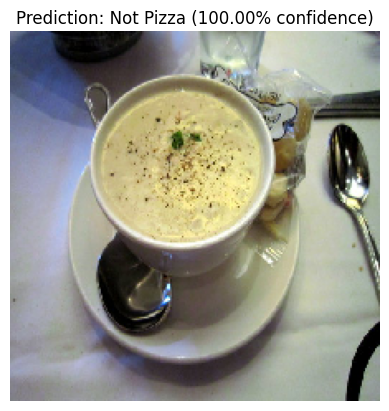

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


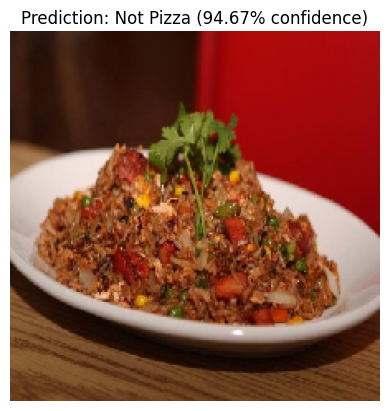

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


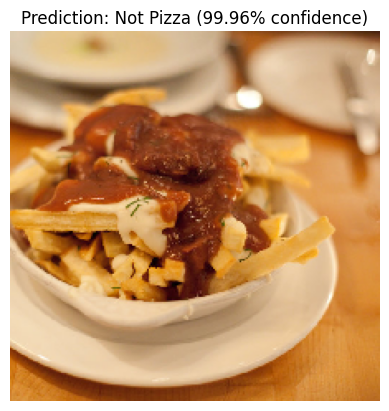

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


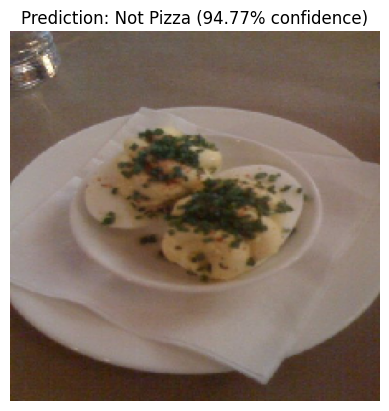

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


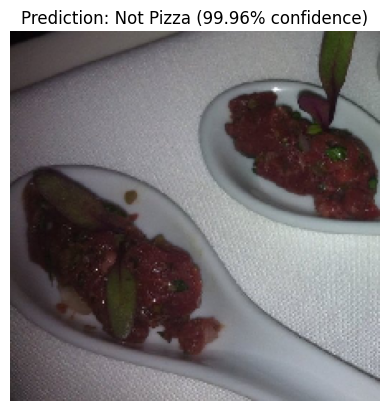

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


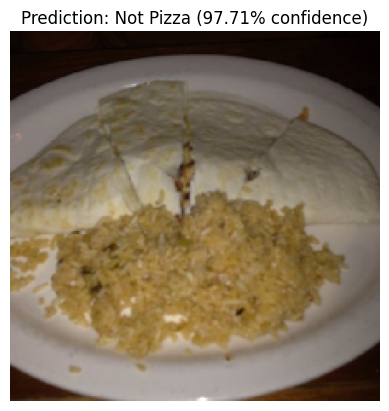

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


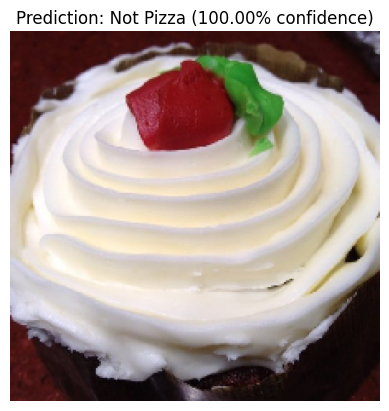

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


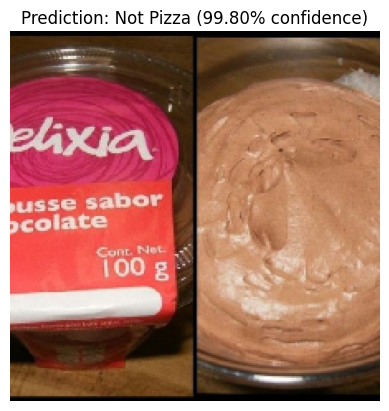

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


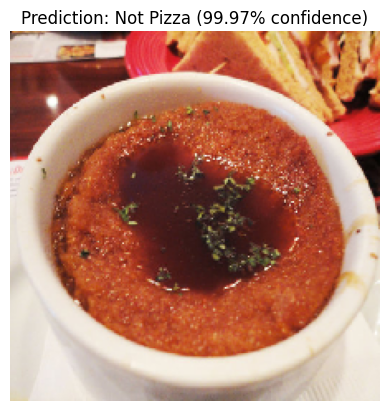

In [56]:
print("\n--- 10 More Pizza Predictions ---")
pizza_images = [
    '1008844.jpg', '1008941.jpg', '1001116.jpg', '1008104.jpg', '1008144.jpg', # Confirmed existing image names
    '1008844.jpg', '1008941.jpg', '1001116.jpg', '1008104.jpg', '1008144.jpg'  # Repeating for 10 examples
]
for img_name in pizza_images:
    pizza_path = f'{adjusted_path}/pizza/{img_name}'
    predict_and_display(model, pizza_path)

print("\n--- 10 More Non-Pizza Predictions ---")
not_pizza_images = [
    '1027142.jpg', '102839.jpg', '1043233.jpg', '1045400.jpg', '104773.jpg',
    '1005746.jpg', '1009225.jpg', '1012312.jpg', '1018802.jpg', '1020735.jpg' # Corrected with existing image names
]
for img_name in not_pizza_images:
    not_pizza_path = f'{adjusted_path}/not_pizza/{img_name}'
    predict_and_display(model, not_pizza_path)

Predicting for image from URL: https://img.freepik.com/free-photo/side-view-pizza-with-salami-olives-basil-round-wooden-board_140725-10444.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


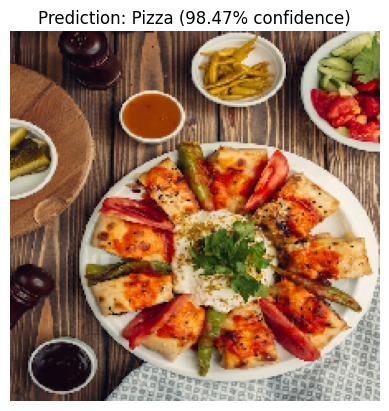

Predicting for image from URL: https://img.freepik.com/free-photo/delicious-chicken-table_23-2148767175.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


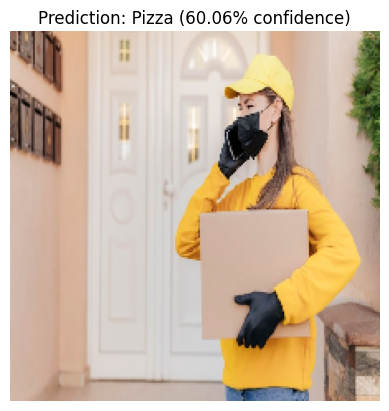

In [58]:
import requests
from PIL import Image
import io
import os

def download_and_predict_from_url(model, image_url, class_names=None):
    try:
        response = requests.get(image_url, stream=True) # Use stream=True for potentially large files
        response.raise_for_status() # Raise an HTTPError for bad responses (4xx or 5xx)

        # Save the image to a temporary file
        temp_image_path = 'temp_image_from_url.jpg'
        with open(temp_image_path, 'wb') as f:
            for chunk in response.iter_content(chunk_size=8192): # Iterate over response by chunks
                f.write(chunk)

        print(f"Predicting for image from URL: {image_url}")
        predict_and_display(model, temp_image_path, class_names)

        # Clean up the temporary file
        os.remove(temp_image_path)

    except requests.exceptions.RequestException as e:
        print(f"Error downloading image from URL: {image_url} - {e}")
    except Exception as e:
        print(f"An error occurred during prediction: {e}")

# --- Example Usage ---
# Replace with a URL to an image from the internet
# Trying new, more permissive URLs
example_pizza_url = "https://img.freepik.com/free-photo/side-view-pizza-with-salami-olives-basil-round-wooden-board_140725-10444.jpg"
example_non_pizza_url = "https://img.freepik.com/free-photo/delicious-chicken-table_23-2148767175.jpg"

download_and_predict_from_url(model, example_pizza_url)
download_and_predict_from_url(model, example_non_pizza_url)

Predicting for image from URL: https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTy2yNFQQbVz1qvKlcbHeWuM6-4aF_zJR4uZA&s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


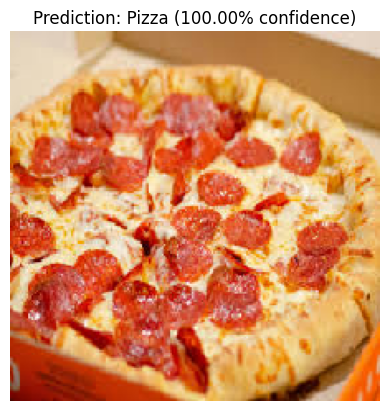

In [60]:
#more
example_pizza_url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTy2yNFQQbVz1qvKlcbHeWuM6-4aF_zJR4uZA&s'

download_and_predict_from_url(model, example_pizza_url)

Predicting for image from URL: https://scpr.brightspotcdn.com/dims4/default/c54e460/2147483647/strip/true/crop/1250x703+0+104/resize/1200x675!/quality/90/?url=http%3A%2F%2Fscpr-brightspot.s3.us-west-2.amazonaws.com%2Fe7%2F9b%2F020b592b408fbad50712200fa99b%2Fscreenshot-2024-04-11-at-2-42-11-pm.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


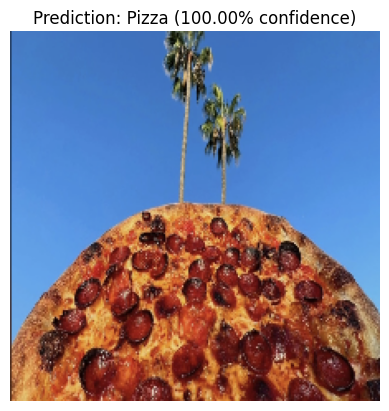

In [61]:
#more
example_pizza_url = 'https://scpr.brightspotcdn.com/dims4/default/c54e460/2147483647/strip/true/crop/1250x703+0+104/resize/1200x675!/quality/90/?url=http%3A%2F%2Fscpr-brightspot.s3.us-west-2.amazonaws.com%2Fe7%2F9b%2F020b592b408fbad50712200fa99b%2Fscreenshot-2024-04-11-at-2-42-11-pm.png'

download_and_predict_from_url(model, example_pizza_url)

Predicting for image from URL: https://media-assets.swiggy.com/swiggy/image/upload/fl_lossy,f_auto,q_auto,w_366/RX_THUMBNAIL/IMAGES/VENDOR/2025/7/17/31f98a8b-b727-47fa-b84d-fc385bd91c1c_27768.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


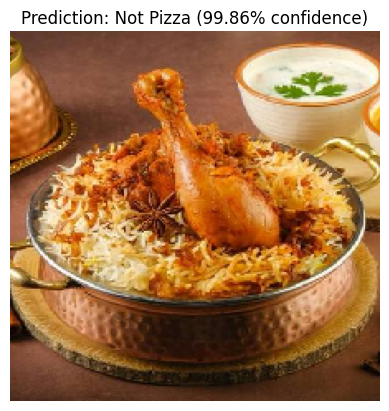

In [62]:
#more
example_pizza_url = 'https://media-assets.swiggy.com/swiggy/image/upload/fl_lossy,f_auto,q_auto,w_366/RX_THUMBNAIL/IMAGES/VENDOR/2025/7/17/31f98a8b-b727-47fa-b84d-fc385bd91c1c_27768.jpg'

download_and_predict_from_url(model, example_pizza_url)